In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
!pip install torch torchvision
!pip install detectron2 -f \
  https://dl.fbaipublicfiles.com/detectron2/wheels/cu117/torch2.0/index.html
!pip install pycocotools


In [7]:
# Path to the dataset
DATA_ROOT = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/0001"
IMG_DIR = os.path.join(DATA_ROOT, "labeled/image_00")
ANN_PATH = os.path.join(DATA_ROOT, "3d_ann.json")

In [47]:
import os
import json

def get_all_classes_from_root(root_dir):
    classes = set()
    for seq_folder in os.listdir(root_dir):
        seq_path = os.path.join(root_dir, seq_folder)
        ann_path = os.path.join(seq_path, "3d_ann.json")
        if os.path.exists(ann_path):
            with open(ann_path, 'r') as f:
                annotations = json.load(f)
                # annotations is a list of dicts (one per frame)
                for frame in annotations:
                    cuboids = frame.get("cuboids", [])
                    for cuboid in cuboids:
                        label = cuboid.get("label")
                        if label:
                            classes.add(label)
    return classes

root_dir = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06"
all_classes = get_all_classes_from_root(root_dir)
print(f"All classes found: {all_classes}")
print(f"Number of unique classes: {len(all_classes)}")


All classes found: {'Bus', 'Truck', 'Traffic_Guidance_Objects', 'Pedestrian', 'Car', 'Garbage_Containers_on_Wheels'}
Number of unique classes: 6


Batch 1
 - Number of images: 2
 - Image sizes: [torch.Size([3, 1024, 1280]), torch.Size([3, 1024, 1280])]
 - Number of targets: 2
 - Targets example: {'boxes': tensor([[ 50.,  50., 200., 200.]]), 'labels': tensor([1]), 'image_id': tensor([1197])}
 - Labels in first target: tensor([1])


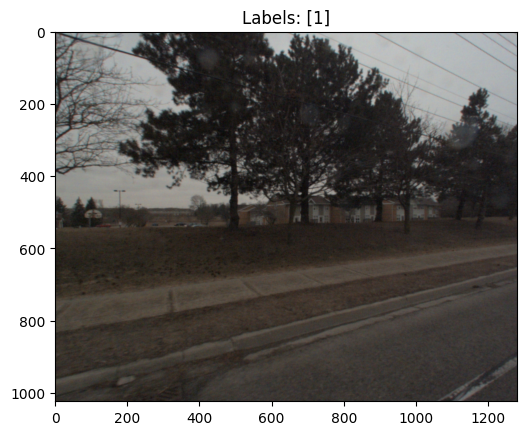

Batch 2
 - Number of images: 2
 - Image sizes: [torch.Size([3, 1024, 1280]), torch.Size([3, 1024, 1280])]
 - Number of targets: 2
 - Targets example: {'boxes': tensor([[ 50.,  50., 200., 200.]]), 'labels': tensor([1]), 'image_id': tensor([782])}
 - Labels in first target: tensor([1])


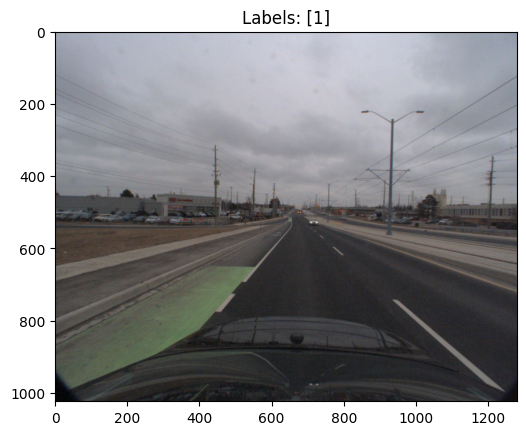

Batch 3
 - Number of images: 2
 - Image sizes: [torch.Size([3, 1024, 1280]), torch.Size([3, 1024, 1280])]
 - Number of targets: 2
 - Targets example: {'boxes': tensor([[ 50.,  50., 200., 200.]]), 'labels': tensor([1]), 'image_id': tensor([740])}
 - Labels in first target: tensor([1])


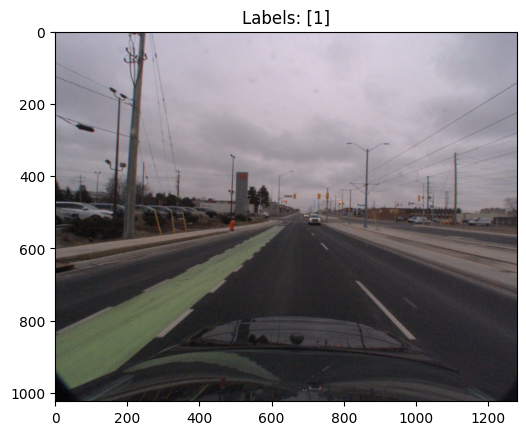

In [48]:
for i, (images, targets) in enumerate(dataloader):
    print(f"Batch {i+1}")
    print(f" - Number of images: {len(images)}")
    print(f" - Image sizes: {[img.shape for img in images]}")  # usually (3, H, W)
    print(f" - Number of targets: {len(targets)}")
    print(f" - Targets example: {targets[0]}")  # print first target dictionary
    print(f" - Labels in first target: {targets[0]['labels']}")
    
    # Optionally display the first image (convert tensor to numpy):
    import matplotlib.pyplot as plt
    img = images[0].permute(1, 2, 0).cpu().numpy()  # CHW -> HWC
    plt.imshow(img)
    plt.title(f"Labels: {targets[0]['labels'].tolist()}")
    plt.show()

    if i == 2:  # check only first 3 batches
        break


In [61]:
import os
import json
import yaml
import numpy as np
import cv2
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torchvision.transforms as T

In [70]:
import yaml
import numpy as np

def parse_camera_intrinsics(yaml_path):
    with open(yaml_path, 'r') as f:
        data = yaml.safe_load(f)
    
    K = np.array(data['camera_matrix']['data']).reshape(3,3)
    dist = np.array(data['distortion_coefficients']['data'])
    width = data.get('image_width')
    height = data.get('image_height')
    
    return K, dist, width, height

# Usage
K, dist, w, h = parse_camera_intrinsics('/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/calib/00.yaml')
print("Camera matrix K:\n", K)
print("Distortion coefficients:\n", dist)
print(f"Image size: {w}x{h}")


Camera matrix K:
 [[ 6.53956033e+02 -2.35925653e-01  6.53221173e+02]
 [ 0.00000000e+00  6.55540089e+02  5.08732864e+02]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Distortion coefficients:
 [-0.21107823  0.10115754 -0.00032952  0.00033042 -0.02320539]
Image size: 1280x1024


In [72]:
import yaml
import numpy as np

def parse_extrinsics_yaml(yaml_path):
    with open(yaml_path, 'r') as f:
        data = yaml.safe_load(f)
    
    # Each entry is a 4x4 matrix (list of lists)
    extrinsics = {}
    for key, mat in data.items():
        extrinsics[key] = np.array(mat)
    
    return extrinsics

# Usage
extrinsics = parse_extrinsics_yaml('/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/calib/extrinsics.yaml')
print("Transformation matrix T_LIDAR_00CAMERA:\n", extrinsics['T_LIDAR_00CAMERA'])


Transformation matrix T_LIDAR_00CAMERA:
 [[ 0.0139568  -0.00513276  0.999877    0.529813  ]
 [-0.999776    0.0150765   0.0140207   0.0554466 ]
 [-0.0151347  -0.999861   -0.00490951 -0.607604  ]
 [ 0.          0.          0.          1.        ]]


In [62]:
def load_yaml(yaml_path):
    with open(yaml_path, 'r') as f:
        return yaml.safe_load(f)

def compute_3d_bbox_corners(center, dims, ry):
    l, w, h = dims
    x_c, y_c, z_c = center
    x_corners = [l/2, l/2, -l/2, -l/2, l/2, l/2, -l/2, -l/2]
    y_corners = [0,0,0,0,-h,-h,-h,-h]
    z_corners = [w/2, -w/2, -w/2, w/2, w/2, -w/2, -w/2, w/2]
    corners = np.vstack([x_corners, y_corners, z_corners])
    R = np.array([
        [np.cos(ry), 0, np.sin(ry)],
        [0, 1, 0],
        [-np.sin(ry), 0, np.cos(ry)]
    ])
    corners_rot = R @ corners
    corners_rot[0, :] += x_c
    corners_rot[1, :] += y_c
    corners_rot[2, :] += z_c
    return corners_rot.T

def transform_points(points, T):
    n = points.shape[0]
    points_h = np.hstack((points, np.ones((n,1))))
    points_cam = (T @ points_h.T).T[:, :3]
    return points_cam

def project_to_image(points_3d, K):
    points_2d = (K @ points_3d.T).T
    points_2d[:, 0] /= points_2d[:, 2]
    points_2d[:, 1] /= points_2d[:, 2]
    return points_2d[:, :2]

def get_2d_bbox(corners_2d):
    xmin = np.min(corners_2d[:, 0])
    xmax = np.max(corners_2d[:, 0])
    ymin = np.min(corners_2d[:, 1])
    ymax = np.max(corners_2d[:, 1])
    return [xmin, ymin, xmax, ymax]

In [64]:
def get_transform(train):
    transforms = []
    transforms.append(T.ToTensor())
    # Add augmentations if needed
    return T.Compose(transforms)

In [ ]:
import os
import json

# === Paths ===
cadc_root = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/0001" 
image_folder = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/0001/labeled/image_00/data"
timestamp_file = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/0001/labeled/image_00/timestamps.txt"
annotation_file = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/0001/3d_ann.json

In [91]:
#!/usr/bin/env python

import numpy as np
import cv2

class lidar_utils:
  def __init__(self, T_CAM_LIDAR):
    self.T_CAM_LIDAR = T_CAM_LIDAR;
    print("init lidar utils")

  def project_points(self, img, lidar_path, T_IMG_CAM, T_CAM_LIDAR, dist_coeffs, DISTORTED):
    self.T_CAM_LIDAR = T_CAM_LIDAR;

    scan_data = np.fromfile(lidar_path, dtype=np.float32);

    # 2D array where each row contains a point [x, y, z, intensity]
    lidar = scan_data.reshape((-1, 4));

    # Get height and width of the image
    h, w = img.shape[:2]

    projected_points = [];

    [rows, cols] = lidar.shape;
    # print(lidar[0,:])
    # print(lidar[1,:])
    # print(lidar[1,0:3])

    for i in range(rows):
      # print(lidar[i,:])
      p = np.array([0.0, 0.0, 0.0, 1.0]);
      p[0:3] = lidar[i,0:3];
      # print("p",p);
      projected_p =  np.matmul(self.T_CAM_LIDAR, p.transpose());
      if projected_p[2] < 2: # arbitrary cut off
        continue;
      projected_points.append([projected_p[0], projected_p[1], projected_p[2]]);

    #print("projected_points", projected_points)

    # Send [x, y, z] and Transform
    projected_points_np = np.array(projected_points)
    image_points = self.project(projected_points_np, T_IMG_CAM, dist_coeffs, DISTORTED);
    # print("image_points")
    # print(image_points)

    radius = 0

    [rows, cols] = projected_points_np.shape;

    NUM_COLOURS = 7;
    rainbow = [
      [0, 0, 255], # Red
      [0, 127, 255], # Orange
      [0, 255, 255], # Yellow
      [0, 255, 0], # Green
      [255, 0, 0], # Blue
      [130, 0, 75], # Indigo
      [211, 0, 148] # Violet
    ];

    for i in range(rows):
      colour = int(NUM_COLOURS*(projected_points_np[i][2]/70));
      x = int(image_points[i][0])
      y = int(image_points[i][1])
      if x < 0 or x > w - 1 or y < 0 or y > h - 1:
        continue;
      if colour > NUM_COLOURS-1:
        continue;

      cv2.circle(img, (x,y), radius, rainbow[colour], thickness=2, lineType=8, shift=0);

    return img;

  def project(self, p_in, T_IMG_CAM, dist_coeffs, DISTORTED):
    p_out = []
    [rows, cols] = p_in.shape;

    for i in range(rows):
      # print("p_in[i]", p_in[i])
      point = np.array([0.0, 0.0, 0.0, 1.0]);
      # print("p_in[i][0]",p_in[i][0])
      point[0:3] = p_in[i];
      # print("p[0]",p[0])
      if DISTORTED:
        rvec = tvec = np.zeros(3)
        # print(p[0:3])
        # print(T_IMG_CAM[0:3,0:3])
        # print(np.array(calib['CAM02']['distortion_coefficients']['data']))
        image_points, jac = cv2.projectPoints(np.array([point[0:3]]), rvec, tvec, T_IMG_CAM[0:3,0:3], dist_coeffs)
        p_out.append([image_points[0,0,0], image_points[0,0,1]]);
        # print("image_points", image_points[0,0])
      else:
        curr = np.matmul(T_IMG_CAM, point.transpose()).transpose();
        # print("curr",curr);
        done = [curr[0] / curr[2], curr[1] / curr[2]]
        p_out.append(done);
        # print("p_out append", done)

    return p_out;

In [88]:

import yaml
import numpy as np

def load_calibration(calib_path):
  calib = {}

  # Get calibrations
  calib['extrinsics'] = yaml.load(open(calib_path + '/extrinsics.yaml'), yaml.SafeLoader)
  calib['CAM00'] = yaml.load(open(calib_path + '/00.yaml'), yaml.SafeLoader)
  calib['CAM01'] = yaml.load(open(calib_path + '/01.yaml'), yaml.SafeLoader)
  calib['CAM02'] = yaml.load(open(calib_path + '/02.yaml'), yaml.SafeLoader)
  calib['CAM03'] = yaml.load(open(calib_path + '/03.yaml'), yaml.SafeLoader)
  calib['CAM04'] = yaml.load(open(calib_path + '/04.yaml'), yaml.SafeLoader)
  calib['CAM05'] = yaml.load(open(calib_path + '/05.yaml'), yaml.SafeLoader)
  calib['CAM06'] = yaml.load(open(calib_path + '/06.yaml'), yaml.SafeLoader)
  calib['CAM07'] = yaml.load(open(calib_path + '/07.yaml'), yaml.SafeLoader)

  return calib

init lidar utils
90


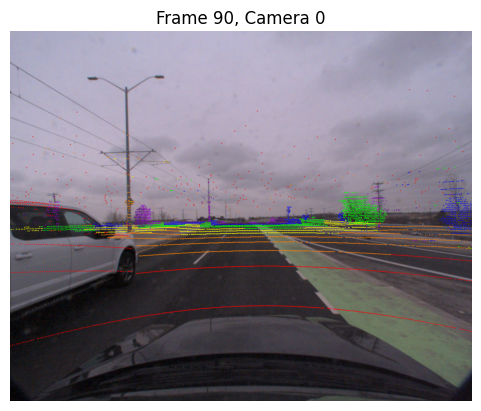

91


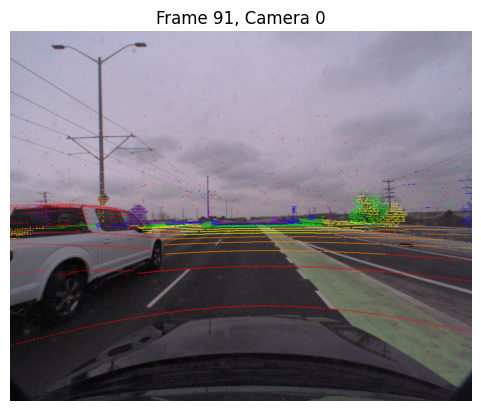

92


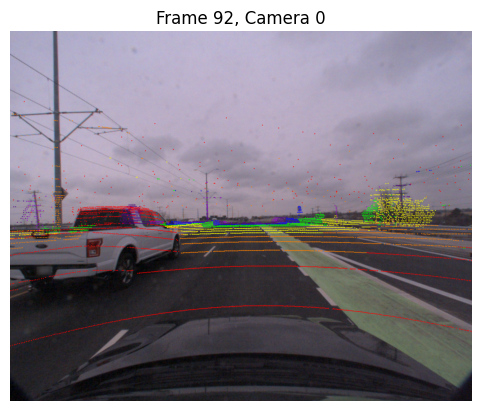

93


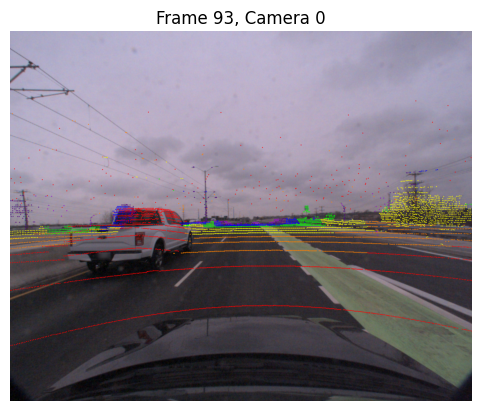

94


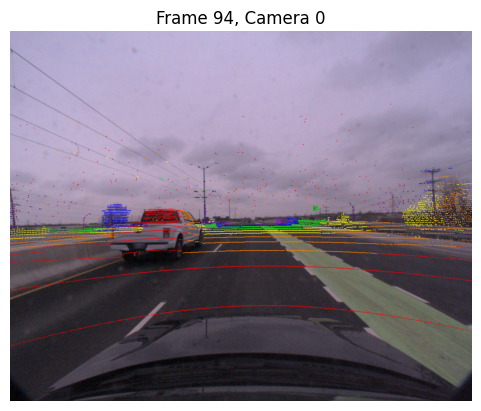

95


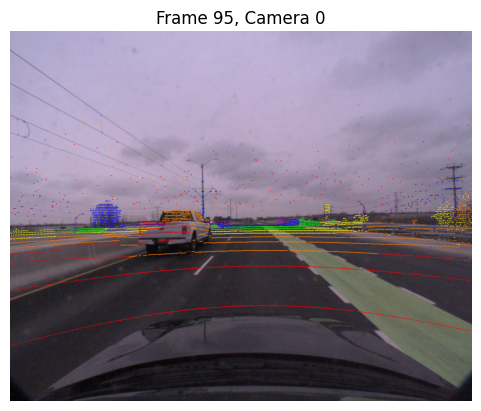

96


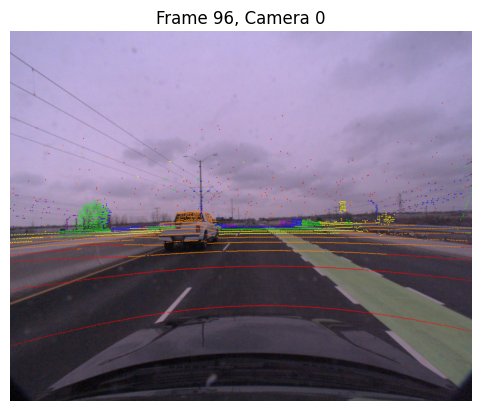

97


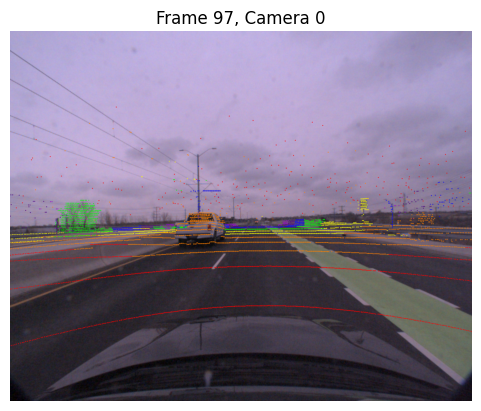

98


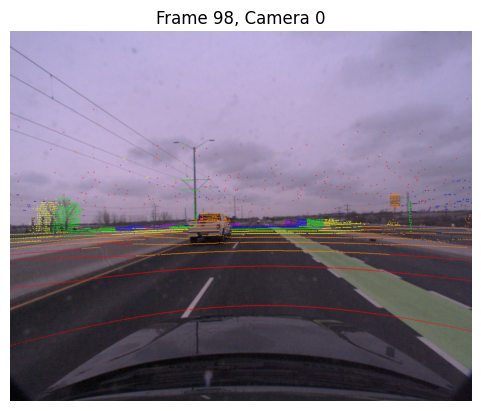

99


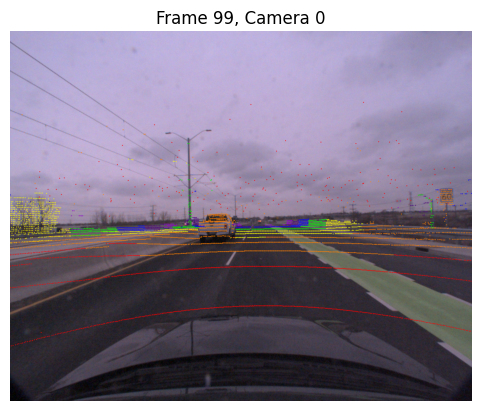

100


[ WARN:0@8709.482] global loadsave.cpp:268 findDecoder imread_('/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/0001/labeled/image_00/data/0000000100.png'): can't open/read file: check file path/integrity


FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/0001/labeled/lidar_points/data/0000000100.bin'

In [98]:
#!/usr/bin/env python

import numpy as np
import cv2
import matplotlib.pyplot as plt

frame = 90
cam = '0'
seq = '0001'
DISTORTED = False
MOVE_FORWARD = True
BASE = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/"

if DISTORTED:
  path_type = 'raw'
else:
  path_type = 'processed'

lidar_path = BASE + seq + "/" + "labeled" + "/lidar_points/data/" + format(frame, '010') + ".bin";
calib_path = BASE + "calib/";
img_path = BASE + seq + "/" + "labeled" + "/image_0" + cam + "/data/" + format(frame, '010') + ".png";

calib = load_calibration(calib_path);

# Projection matrix from camera to image frame
T_IMG_CAM = np.eye(4);
T_IMG_CAM[0:3,0:3] = np.array(calib['CAM0' + cam]['camera_matrix']['data']).reshape(-1, 3);
T_IMG_CAM = T_IMG_CAM[0:3,0:4]; # remove last row

T_CAM_LIDAR = np.linalg.inv(np.array(calib['extrinsics']['T_LIDAR_CAM0' + cam]));

dist_coeffs = np.array(calib['CAM0' + cam]['distortion_coefficients']['data'])

lidar_utils_obj = lidar_utils(T_CAM_LIDAR);

while True:
    print(frame)
    # read image
    img = cv2.imread(img_path)

    # Project points onto image
    img = lidar_utils_obj.project_points(img, lidar_path, T_IMG_CAM, T_CAM_LIDAR, dist_coeffs, DISTORTED);

    # Convert BGR to RGB for matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title(f'Frame {frame}, Camera {cam}')
    plt.show()

    if MOVE_FORWARD:
        frame += 1
        lidar_path = BASE + seq + "/" + "labeled" + "/lidar_points/data/" + format(frame, '010') + ".bin"
        img_path = BASE  + seq + "/" + "labeled" + "/image_0" + cam + "/data/" + format(frame, '010') + ".png"
    else:
        break

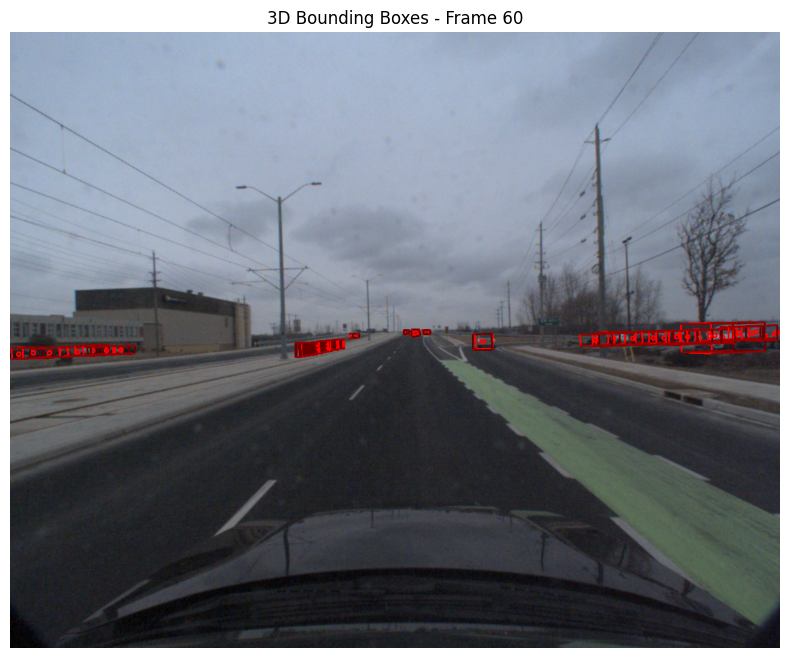

In [104]:
#!/usr/bin/env python

import json
import numpy as np
import cv2
from scipy.spatial.transform import Rotation as R
import matplotlib.pyplot as plt


# Settings
frame = 60
cam = '0'
seq = '0001'
BASE = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/"
path_type = "labeled"

# Paths
lidar_path = BASE + seq + "/" + path_type + "/lidar_points/data/" + format(frame, '010') + ".bin"
calib_path = BASE + "calib/"
img_path = BASE + seq + "/" + path_type + "/image_0" + cam + "/data/" + format(frame, '010') + ".png"
annotations_file = BASE + seq + "/3d_ann.json"

# Load data
with open(annotations_file) as f:
    annotations_data = json.load(f)
calib = load_calibration(calib_path)
img = cv2.imread(img_path)
img_h, img_w = img.shape[:2]

# Calibration matrices
T_IMG_CAM = np.eye(4)
T_IMG_CAM[0:3, 0:3] = np.array(calib['CAM0' + cam]['camera_matrix']['data']).reshape(-1, 3)
T_IMG_CAM = T_IMG_CAM[0:3, 0:4]  # remove last row

T_CAM_LIDAR = np.linalg.inv(np.array(calib['extrinsics']['T_LIDAR_CAM0' + cam]))
T_IMG_LIDAR = np.matmul(T_IMG_CAM, T_CAM_LIDAR)

# Draw cuboids
for cuboid in annotations_data[frame]['cuboids']:
    T_Lidar_Cuboid = np.eye(4)
    T_Lidar_Cuboid[0:3, 0:3] = R.from_euler('z', cuboid['yaw'], degrees=False).as_matrix()
    T_Lidar_Cuboid[0][3] = cuboid['position']['x']
    T_Lidar_Cuboid[1][3] = cuboid['position']['y']
    T_Lidar_Cuboid[2][3] = cuboid['position']['z']

    width = cuboid['dimensions']['x']
    length = cuboid['dimensions']['y']
    height = cuboid['dimensions']['z']
    radius = 3

    # Center point
    tmp = np.matmul(T_CAM_LIDAR, T_Lidar_Cuboid)
    if tmp[2][3] < 0: continue
    test = np.matmul(T_IMG_CAM, tmp)
    x = int(test[0][3] / test[2][3])
    y = int(test[1][3] / test[2][3])
    cv2.circle(img, (x, y), radius, [0, 0, 255], thickness=2)

    # Define cuboid corners
    def corner(x, y, z):
        return np.array([[1,0,0,x],[0,1,0,y],[0,0,1,z],[0,0,0,1]])

    corners = {
        'f_r_b': corner(length/2, -width/2, -height/2),
        'f_r_t': corner(length/2, -width/2, height/2),
        'f_l_b': corner(length/2, width/2, -height/2),
        'f_l_t': corner(length/2, width/2, height/2),
        'b_r_b': corner(-length/2, -width/2, -height/2),
        'b_r_t': corner(-length/2, -width/2, height/2),
        'b_l_b': corner(-length/2, width/2, -height/2),
        'b_l_t': corner(-length/2, width/2, height/2),
    }

    # Project corners
    projected = {}
    for k, mat in corners.items():
        tmp = np.matmul(T_CAM_LIDAR, np.matmul(T_Lidar_Cuboid, mat))
        if tmp[2][3] < 0:
            break
        pt = np.matmul(T_IMG_CAM, tmp)
        coord = (int(pt[0][3] / pt[2][3]), int(pt[1][3] / pt[2][3]))
        if coord[0] < 0 or coord[0] > img_w or coord[1] < 0 or coord[1] > img_h:
            break
        projected[k] = coord
    else:
        # Draw cuboid edges
        p = projected
        cv2.line(img, p['f_r_b'], p['f_r_t'], [0, 0, 255], 2)
        cv2.line(img, p['f_r_b'], p['f_l_b'], [0, 0, 255], 2)
        cv2.line(img, p['f_l_b'], p['f_l_t'], [0, 0, 255], 2)
        cv2.line(img, p['f_l_t'], p['f_r_t'], [0, 0, 255], 2)

        cv2.line(img, p['b_r_b'], p['b_r_t'], [0, 0, 100], 2)
        cv2.line(img, p['b_r_b'], p['b_l_b'], [0, 0, 100], 2)
        cv2.line(img, p['b_l_b'], p['b_l_t'], [0, 0, 100], 2)
        cv2.line(img, p['b_l_t'], p['b_r_t'], [0, 0, 100], 2)

        cv2.line(img, p['f_r_b'], p['b_r_b'], [0, 0, 150], 2)
        cv2.line(img, p['f_r_t'], p['b_r_t'], [0, 0, 150], 2)
        cv2.line(img, p['f_l_b'], p['b_l_b'], [0, 0, 150], 2)
        cv2.line(img, p['f_l_t'], p['b_l_t'], [0, 0, 150], 2)

# ✅ Display image using matplotlib (instead of cv2.imshow)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12, 8))
plt.imshow(img_rgb)
plt.title(f"3D Bounding Boxes - Frame {frame}")
plt.axis('off')
plt.show()


In [209]:
import os
import json
import yaml
import numpy as np
from tqdm import tqdm
from scipy.spatial.transform import Rotation as R
import cv2

# Set paths
base_path = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/"
calib_path = os.path.join(base_path, "calib")
sequence = "0001"
image_dir = os.path.join(base_path, sequence, "labeled", "image_00", "data")
annotation_file = os.path.join(base_path, sequence, "3d_ann.json")

# Load calibration YAML
def load_yaml(file_path):
    with open(file_path) as f:
        return yaml.safe_load(f)

cam_calib = load_yaml(os.path.join(calib_path, "00.yaml"))
extrinsics = load_yaml(os.path.join(calib_path, "extrinsics.yaml"))

# Camera intrinsic matrix
K = np.array(cam_calib["camera_matrix"]["data"]).reshape(3, 3)

# Extrinsics matrix: LiDAR to Camera
T_lidar_cam = np.array(extrinsics["T_LIDAR_CAM00"]).reshape(4, 4)
T_cam_lidar = np.linalg.inv(T_lidar_cam)

# Projection matrix from LiDAR to image
P = K @ T_cam_lidar[:3, :4]

# Load annotations JSON
with open(annotation_file) as f:
    ann_data = json.load(f)

# Get image size by reading the first image
sample_img_path = os.path.join(image_dir, sorted(os.listdir(image_dir))[0])
img = cv2.imread(sample_img_path)
img_height, img_width = img.shape[:2]

# Prepare COCO output
coco_output = {
    "images": [],
    "annotations": [],
    "categories": [],
}

category_to_id = {}
category_id_counter = 1
annotation_id = 1

# Add images info (required by COCO)
for frame_idx, frame_data in enumerate(ann_data):
    image_filename = f"{frame_idx:010d}.png"  # Assuming this naming scheme
    coco_output["images"].append({
        "id": frame_idx,
        "file_name": image_filename,
        "height": img_height,
        "width": img_width
    })

# Process each frame's cuboids
for frame_idx, frame_data in tqdm(enumerate(ann_data), total=len(ann_data)):
    cuboids = frame_data.get("cuboids", [])

    for cuboid in cuboids:
        if cuboid.get("camera_used", "") != None:
            continue
        label = cuboid['label']

        # Add category if not present
        if label not in category_to_id:
            category_to_id[label] = category_id_counter
            coco_output["categories"].append({
                "id": category_id_counter,
                "name": label
            })
            category_id_counter += 1

        # Construct cuboid pose in LiDAR frame
        T = np.eye(4)
        T[:3, :3] = R.from_euler('z', cuboid['yaw'], degrees=False).as_matrix()
        T[0, 3] = cuboid['position']['x']
        T[1, 3] = cuboid['position']['y']
        T[2, 3] = cuboid['position']['z']

        w = cuboid['dimensions']['x']
        l = cuboid['dimensions']['y']
        h = cuboid['dimensions']['z']

        # Cuboid corners in local frame (l,w,h order matters depending on dataset)
        corners = np.array([
            [ l/2,  w/2,  h/2, 1],
            [ l/2, -w/2,  h/2, 1],
            [-l/2, -w/2,  h/2, 1],
            [-l/2,  w/2,  h/2, 1],
            [ l/2,  w/2, -h/2, 1],
            [ l/2, -w/2, -h/2, 1],
            [-l/2, -w/2, -h/2, 1],
            [-l/2,  w/2, -h/2, 1],
        ]).T  # shape (4,8)

        # Transform corners to LiDAR/world frame
        world_corners = T @ corners  # shape (4,8)

        # Project to camera image plane
        proj = P @ world_corners  # shape (3,8)
        proj /= proj[2, :]  # normalize by depth

        x_vals = proj[0, :]
        y_vals = proj[1, :]

        # Filter out boxes that are partially or fully outside image boundaries
        if np.any(x_vals < 0) or np.any(y_vals < 0) or np.any(x_vals > img_width) or np.any(y_vals > img_height):
            continue

        x_min, y_min = int(x_vals.min()), int(y_vals.min())
        x_max, y_max = int(x_vals.max()), int(y_vals.max())
        width = x_max - x_min
        height = y_max - y_min

        if width < 1 or height < 1:
            continue

        # Append annotation
        coco_output["annotations"].append({
            "id": annotation_id,
            "image_id": frame_idx,
            "category_id": category_to_id[label],
            "bbox": [x_min, y_min, width, height],
            "area": width * height,
            "iscrowd": 0,
            "camera_used": cuboid.get("camera_used") 
        })

        annotation_id += 1

# Save to JSON file
with open("cadc_detectron2_annotations.json", "w") as f:
    json.dump(coco_output, f, indent=2)

print("Detectron2 COCO annotation JSON saved.")


100%|██████████| 100/100 [00:01<00:00, 51.29it/s]


Detectron2 COCO annotation JSON saved.


loading annotations into memory...
Done (t=0.19s)
creating index...
index created!
Dataset Overview:
- Number of images: 800
- Number of annotations: 82956
- Number of object categories: 4


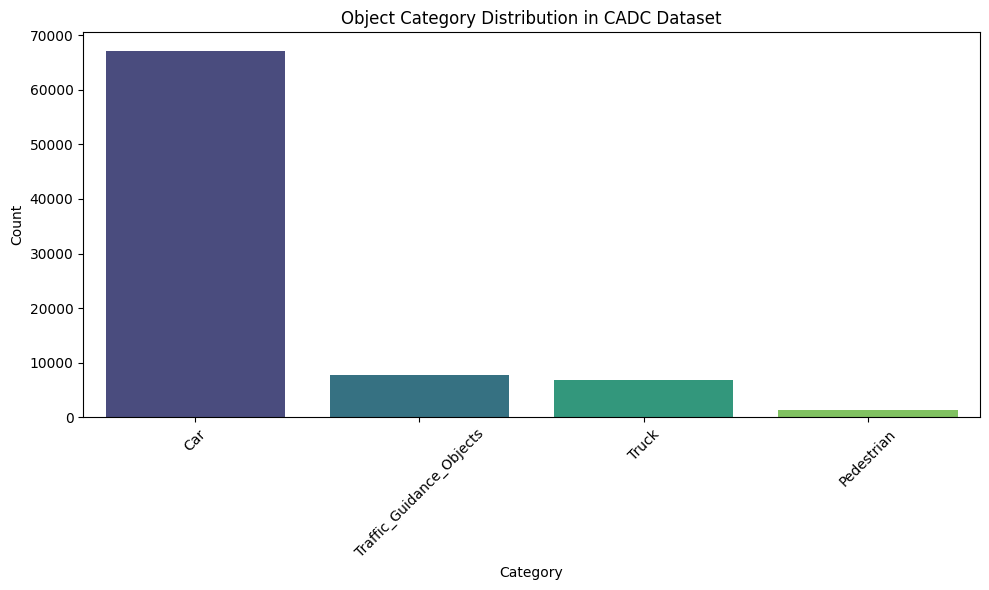

In [347]:
from pycocotools.coco import COCO
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Path to your COCO annotation JSON
annotation_path = "/kaggle/working/cadc_detectron2_annotations_all_cams.json"

# Load annotations
coco = COCO(annotation_path)

# Basic stats
num_images = len(coco.getImgIds())
num_annotations = len(coco.getAnnIds())
num_categories = len(coco.getCatIds())

print("Dataset Overview:")
print(f"- Number of images: {num_images}")
print(f"- Number of annotations: {num_annotations}")
print(f"- Number of object categories: {num_categories}")

# Category Frequency
cat_id_to_name = {cat['id']: cat['name'] for cat in coco.loadCats(coco.getCatIds())}
annotations = coco.loadAnns(coco.getAnnIds())

category_counts = {}
for ann in annotations:
    cat_id = ann['category_id']
    category_counts[cat_id] = category_counts.get(cat_id, 0) + 1

# Convert to DataFrame for plotting
cat_df = pd.DataFrame({
    'Category': [cat_id_to_name[cid] for cid in category_counts],
    'Count': [count for count in category_counts.values()]
}).sort_values("Count", ascending=False)

# Plot category distribution
plt.figure(figsize=(10, 6))
sns.barplot(data=cat_df, x="Category", y="Count", palette="viridis")
plt.xticks(rotation=45)
plt.title("Object Category Distribution in CADC Dataset")
plt.tight_layout()
plt.show()


In [222]:
import os
import json
import yaml
import numpy as np
from tqdm import tqdm
from scipy.spatial.transform import Rotation as R
import cv2

# Set base path
base_path = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/"
sequence = "0001"
calib_path = os.path.join(base_path, "calib")
annotation_file = os.path.join(base_path, sequence, "3d_ann.json")

# Load extrinsics
def load_yaml(path): return yaml.safe_load(open(path))
extrinsics = load_yaml(os.path.join(calib_path, "extrinsics.yaml"))

# Load 3D annotations
with open(annotation_file) as f:
    ann_data = json.load(f)

# Prepare COCO output
coco_output = {
    "images": [],
    "annotations": [],
    "categories": [],
}

category_to_id = {}
category_id_counter = 1
annotation_id = 1
image_id_counter = 0

# Loop over all image_* folders (image_00, image_01, ...)
for cam_id in range(10):  # assuming max 10 cameras
    cam_str = f"{cam_id:02d}"
    image_dir = os.path.join(base_path, sequence, "labeled", f"image_{cam_str}", "data")
    calib_file = os.path.join(calib_path, f"{cam_str}.yaml")
    extr_key = f"T_LIDAR_CAM{cam_str}"

    if not os.path.exists(image_dir) or not os.path.exists(calib_file) or extr_key not in extrinsics:
        continue  # Skip if calibration or images missing

    print(f"Processing camera {cam_str}")

    # Load camera calibration
    cam_calib = load_yaml(calib_file)
    K = np.array(cam_calib["camera_matrix"]["data"]).reshape(3, 3)

    # Transform from LiDAR to camera
    T_lidar_cam = np.array(extrinsics[extr_key]).reshape(4, 4)
    T_cam_lidar = np.linalg.inv(T_lidar_cam)

    # Projection matrix
    P = K @ T_cam_lidar[:3, :4]

    # Read image shape
    image_files = sorted(os.listdir(image_dir))
    if not image_files:
        continue
    img_path_sample = os.path.join(image_dir, image_files[0])
    img_sample = cv2.imread(img_path_sample)
    img_height, img_width = img_sample.shape[:2]

    # Add image entries
    for frame_idx, img_name in enumerate(image_files):
        coco_output["images"].append({
            "id": image_id_counter,
            "file_name": f"image_{cam_str}/data/{img_name}",
            "height": img_height,
            "width": img_width,
        })

        # Annotations for this frame
        cuboids = ann_data[frame_idx].get("cuboids", [])
        for cuboid in cuboids:
            # Only annotate if this camera was used (or is unset)
            if cuboid.get("camera_used") not in [None, int(cam_str)]:
                continue

            label = cuboid['label']
            if label not in category_to_id:
                category_to_id[label] = category_id_counter
                coco_output["categories"].append({
                    "id": category_id_counter,
                    "name": label
                })
                category_id_counter += 1

            # Get cuboid transformation
            T = np.eye(4)
            T[:3, :3] = R.from_euler('z', cuboid['yaw'], degrees=False).as_matrix()
            T[0, 3] = cuboid['position']['x']
            T[1, 3] = cuboid['position']['y']
            T[2, 3] = cuboid['position']['z']

            w = cuboid['dimensions']['x']
            l = cuboid['dimensions']['y']
            h = cuboid['dimensions']['z']

            # Create 3D bounding box corners
            corners = np.array([
                [ l/2,  w/2,  h/2, 1],
                [ l/2, -w/2,  h/2, 1],
                [-l/2, -w/2,  h/2, 1],
                [-l/2,  w/2,  h/2, 1],
                [ l/2,  w/2, -h/2, 1],
                [ l/2, -w/2, -h/2, 1],
                [-l/2, -w/2, -h/2, 1],
                [-l/2,  w/2, -h/2, 1],
            ]).T

            # Transform to world
            world_corners = T @ corners

            # Project into image
            proj = P @ world_corners
            proj /= proj[2, :]

            x_vals = proj[0, :]
            y_vals = proj[1, :]

            # Check boundaries
            if np.any(x_vals < 0) or np.any(y_vals < 0) or np.any(x_vals > img_width) or np.any(y_vals > img_height):
                continue

            x_min, y_min = int(x_vals.min()), int(y_vals.min())
            x_max, y_max = int(x_vals.max()), int(y_vals.max())
            width = x_max - x_min
            height = y_max - y_min

            if width < 1 or height < 1:
                continue

            coco_output["annotations"].append({
                "id": annotation_id,
                "image_id": image_id_counter,
                "category_id": category_to_id[label],
                "bbox": [x_min, y_min, width, height],
                "area": width * height,
                "iscrowd": 0,
                "camera_used": cuboid.get("camera_used")
            })
            annotation_id += 1

        image_id_counter += 1

# Save final JSON
with open("cadc_detectron2_annotations_all_cams.json", "w") as f:
    json.dump(coco_output, f, indent=2)

print("COCO annotation file created for all cameras.")


Processing camera 00
Processing camera 01
Processing camera 02
Processing camera 03
Processing camera 04
Processing camera 05
Processing camera 06
Processing camera 07
COCO annotation file created for all cameras.


In [119]:
import torch
import torchvision
from torchvision.models.detection.faster_rcnn import fasterrcnn_resnet50_fpn
from torchvision.datasets import CocoDetection
from torchvision.transforms import functional as F
from torch.utils.data import DataLoader, Dataset
import os
import json
from PIL import Image
import numpy as np


In [245]:
class CADCCocoDataset(Dataset):
    def __init__(self, root, annFile, transforms=None):
        self.root = root
        self.coco = json.load(open(annFile))
        self.imgs = self.coco['images']
        self.anns = self.coco['annotations']
        self.cat2id = {cat['id']: cat['name'] for cat in self.coco['categories']}
        self.transforms = transforms

        # Build image_id to annotations index
        self.imgId_to_anns = {}
        for ann in self.anns:
            self.imgId_to_anns.setdefault(ann['image_id'], []).append(ann)

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        img_info = self.imgs[idx]
        img_path = os.path.join(self.root, img_info['file_name'])
        img = Image.open(img_path).convert("RGB")

        annotations = self.imgId_to_anns.get(img_info['id'], [])

        boxes = []
        labels = []
        areas = []
        iscrowd = []

        for ann in annotations:
            xmin, ymin, w, h = ann['bbox']
            boxes.append([xmin, ymin, xmin + w, ymin + h])
            labels.append(ann['category_id'])
            areas.append(ann['area'])
            iscrowd.append(ann['iscrowd'])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        areas = torch.as_tensor(areas, dtype=torch.float32)
        iscrowd = torch.as_tensor(iscrowd, dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = torch.tensor([img_info['id']])
        target["area"] = areas
        target["iscrowd"] = iscrowd

        if self.transforms:
            img, target = self.transforms(img, target)

        return img, target



📸 Visualizing Image ID 103


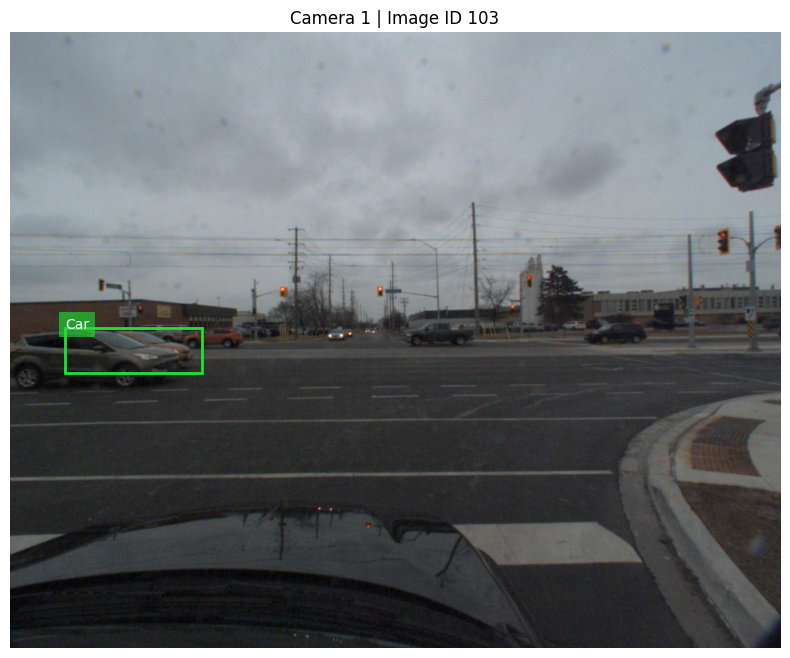


📸 Visualizing Image ID 104


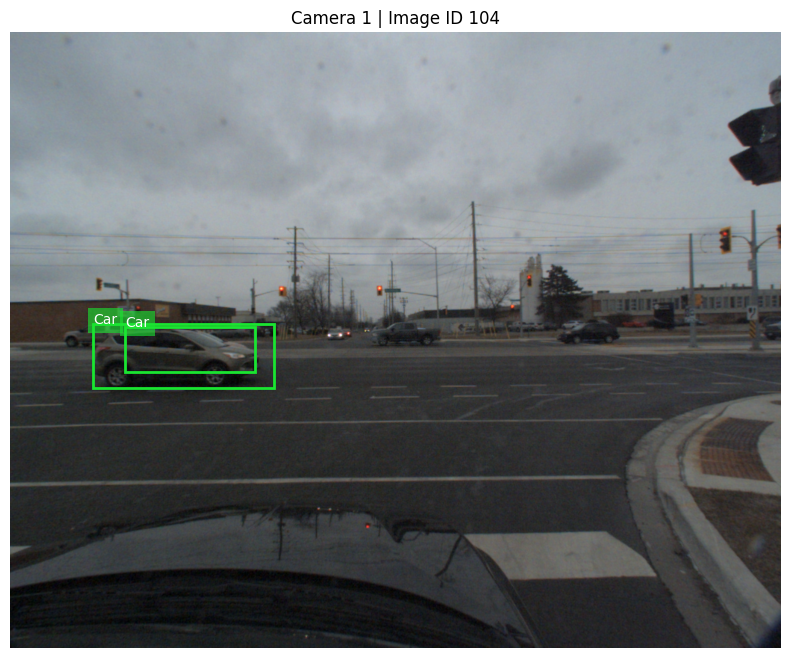


📸 Visualizing Image ID 105


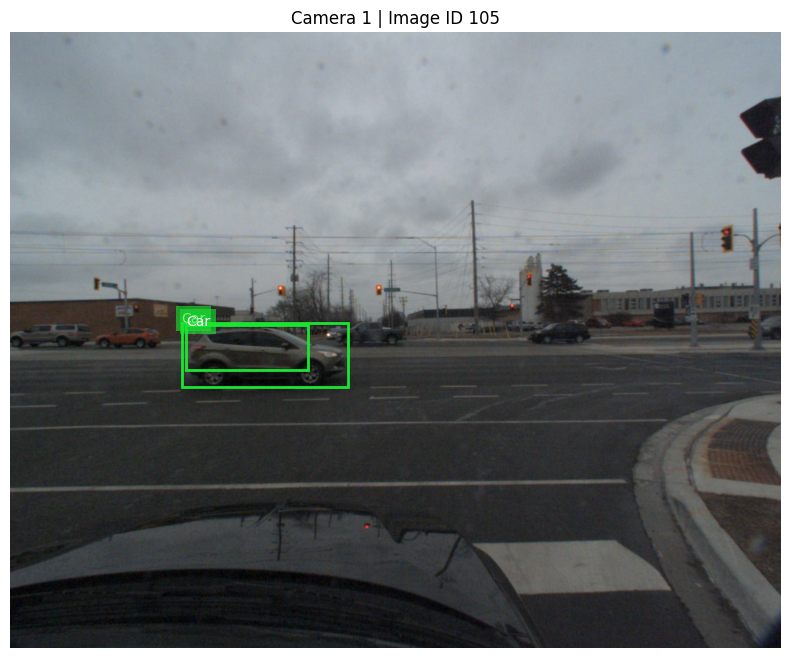


📸 Visualizing Image ID 106


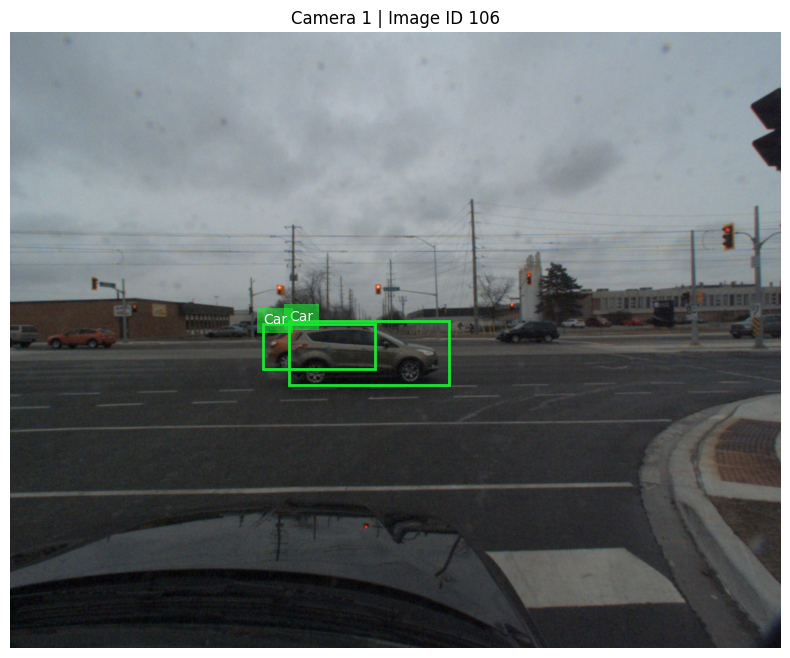


📸 Visualizing Image ID 107


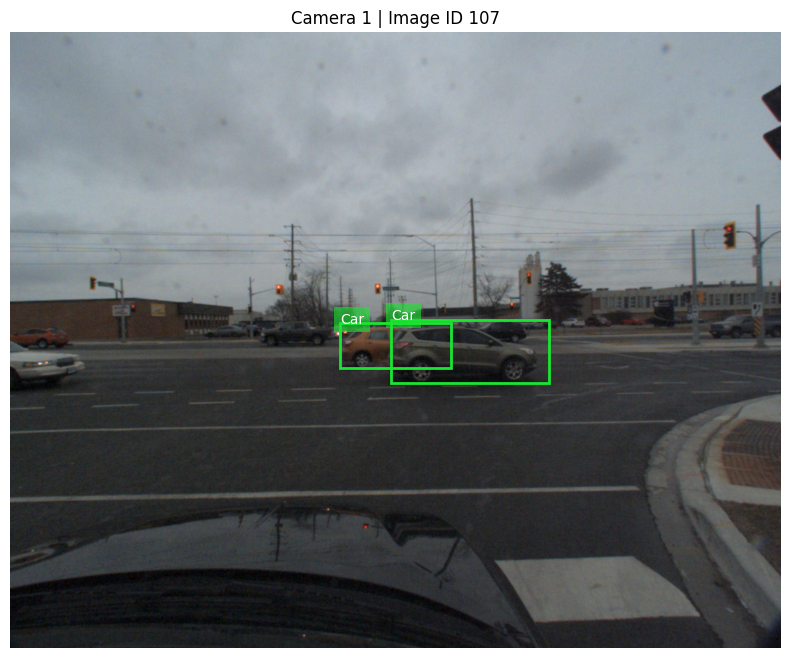

In [241]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import json
import os
from PIL import Image
import random

# ==== CONFIGURATION ====
camera_id = 1  # Change this to 0, 1, 2, or 3
sequence = "0001"
base_path = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06"
image_dir = os.path.join(base_path, sequence, "labeled", f"image_0{camera_id}", "data")
annotation_json = "/kaggle/working/cadc_detectron2_annotations_all_cams.json"

# ==== Load annotations ====
with open(annotation_json) as f:
    coco = json.load(f)

# Map category ID to name
id_to_cat = {cat['id']: cat['name'] for cat in coco['categories']}
category_colors = {cat_id: (random.random(), random.random(), random.random()) for cat_id in id_to_cat}

# Build image_id -> image_info
image_id_to_info = {img['id']: img for img in coco['images']}

# Filter annotations for selected camera
camera_annotations = [ann for ann in coco['annotations'] if ann.get('camera_used') == camera_id]

# Group annotations by image_id
imgId_to_anns = {}
for ann in camera_annotations:
    imgId_to_anns.setdefault(ann['image_id'], []).append(ann)

# Only use images that have annotations for this camera
selected_image_ids = list(imgId_to_anns.keys())

# ==== Visualization Function ====
def visualize_image(image_id):
    img_info = image_id_to_info.get(image_id)
    if img_info is None:
        print(f"Image ID {image_id} not found.")
        return

    filename = img_info['file_name']
    img_path = os.path.join("/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/0001/labeled", filename)



    if not os.path.exists(img_path):
        print(f"Image not found: {img_path}")
        return

    img = Image.open(img_path).convert("RGB")
    anns = imgId_to_anns.get(image_id, [])

    fig, ax = plt.subplots(1, figsize=(10, 8))
    ax.imshow(img)

    for ann in anns:
        bbox = ann['bbox']
        x, y, w, h = bbox
        cat_id = ann['category_id']
        color = category_colors[cat_id]

        rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor=color, facecolor='none')
        ax.add_patch(rect)

        cat_name = id_to_cat[cat_id]
        ax.text(x, y, cat_name, fontsize=10, color='white',
                bbox=dict(facecolor=color, alpha=0.6, edgecolor='none'))

    plt.axis('off')
    plt.title(f"Camera {camera_id} | Image ID {image_id}")
    plt.show()

# ==== Run Visualization on First Few Images ====
if not selected_image_ids:
    print(f"No annotations found for camera {camera_id}")
else:
    for image_id in selected_image_ids[:5]:  # Visualize first 3 images for this camera
        print(f"\n📸 Visualizing Image ID {image_id}")
        visualize_image(image_id)


In [220]:
import torch
import torchvision
from torchvision.models.detection.faster_rcnn import fasterrcnn_resnet50_fpn

model = fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

print("TorchVision Faster R-CNN loaded successfully.")


TorchVision Faster R-CNN loaded successfully.


In [278]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# Get number of classes from COCO-style dataset
num_classes = len(dataset.coco.getCatIds()) + 1  # +1 for background

# Optional: Print category names
categories = dataset.coco.loadCats(dataset.coco.getCatIds())
print([cat['name'] for cat in categories])

# Load pretrained Faster R-CNN
model = fasterrcnn_resnet50_fpn(pretrained=True)

# Replace classifier head for custom number of classes
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

model.to(device)


['Car', 'Truck', 'Pedestrian', 'Traffic_Guidance_Objects']


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [250]:
from torchvision.datasets import CocoDetection
from torchvision.transforms import functional as F
import torchvision.transforms as T
import torch
from PIL import Image

transform = T.Compose([
    T.ToTensor(),
])


class CocoToFasterRCNNDataset(CocoDetection):
    def __init__(self, img_folder, ann_file, transforms=None):
        super().__init__(img_folder, ann_file)
        self.transforms = transforms

    def __getitem__(self, idx):
        img, targets = super().__getitem__(idx)

        # COCO returns a list of annotations per image
        boxes = []
        labels = []
        for obj in targets:
            xmin, ymin, w, h = obj['bbox']
            boxes.append([xmin, ymin, xmin + w, ymin + h])
            labels.append(obj['category_id'])

        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)
        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((len(labels),), dtype=torch.int64)

        target = {
            'boxes': boxes,
            'labels': labels,
            'image_id': image_id,
            'area': area,
            'iscrowd': iscrowd
        }

        if self.transforms:
            img = self.transforms(img)

        return img, target


In [252]:
import json

json_path = "/kaggle/working/cadc_detectron2_annotations_all_cams.json"
with open(json_path) as f:
    data = json.load(f)

# If images are from multiple cameras
for img in data["images"]:
    cam = img["file_name"][:9]  # e.g., 'image_00'
    img["file_name"] = f"{cam}/data/{img['file_name'][-14:]}"  # keeps '0000000001.png'

with open("/kaggle/working/cadc_coco_updated.json", "w") as f:
    json.dump(data, f, indent=2)


In [256]:
from torchvision.datasets import CocoDetection
from torchvision import transforms

dataset_root = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/0001/labeled"
annotation_file = "/kaggle/working/cadc_detectron2_annotations_all_cams.json"

# When you create the dataset, root points to dataset root, annFile points to the combined JSON
dataset = CocoDetection(root=dataset_root, annFile=annotation_file, transform=transforms.ToTensor())


loading annotations into memory...
Done (t=0.60s)
creating index...
index created!


In [255]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [257]:
data_loader = DataLoader(dataset, batch_size=4, shuffle=True, collate_fn=collate_fn)

def convert_coco_target(ann):
    boxes = []
    labels = []
    for obj in ann:
        boxes.append(obj["bbox"])
        labels.append(obj["category_id"])
    boxes = torch.tensor(boxes, dtype=torch.float32)
    boxes[:, 2:] += boxes[:, :2]  # xywh → xyxy
    labels = torch.tensor(labels, dtype=torch.int64)
    return {"boxes": boxes, "labels": labels}

# Training
model.train()
for epoch in range(5):
    for imgs, anns in data_loader:
        imgs = [img.to(device) for img in imgs]
        targets = [convert_coco_target(ann) for ann in anns]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(imgs, targets)
        loss = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print(f"Epoch {epoch+1}, Loss: {loss.item():.4f}")


Epoch 1, Loss: 1.6739
Epoch 2, Loss: 1.4473
Epoch 3, Loss: 1.2808
Epoch 4, Loss: 1.3480
Epoch 5, Loss: 1.3263


In [258]:
import os
import json
import yaml
import numpy as np
from tqdm import tqdm
from scipy.spatial.transform import Rotation as R
import cv2

# Set base path
base_path = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/"
sequence = "0002"
calib_path = os.path.join(base_path, "calib")
annotation_file = os.path.join(base_path, sequence, "3d_ann.json")

# Load extrinsics
def load_yaml(path): return yaml.safe_load(open(path))
extrinsics = load_yaml(os.path.join(calib_path, "extrinsics.yaml"))

# Load 3D annotations
with open(annotation_file) as f:
    ann_data = json.load(f)

# Prepare COCO output
coco_output = {
    "images": [],
    "annotations": [],
    "categories": [],
}

category_to_id = {}
category_id_counter = 1
annotation_id = 1
image_id_counter = 0

# Loop over all image_* folders (image_00, image_01, ...)
for cam_id in range(10):  # assuming max 10 cameras
    cam_str = f"{cam_id:02d}"
    image_dir = os.path.join(base_path, sequence, "labeled", f"image_{cam_str}", "data")
    calib_file = os.path.join(calib_path, f"{cam_str}.yaml")
    extr_key = f"T_LIDAR_CAM{cam_str}"

    if not os.path.exists(image_dir) or not os.path.exists(calib_file) or extr_key not in extrinsics:
        continue  # Skip if calibration or images missing

    print(f"Processing camera {cam_str}")

    # Load camera calibration
    cam_calib = load_yaml(calib_file)
    K = np.array(cam_calib["camera_matrix"]["data"]).reshape(3, 3)

    # Transform from LiDAR to camera
    T_lidar_cam = np.array(extrinsics[extr_key]).reshape(4, 4)
    T_cam_lidar = np.linalg.inv(T_lidar_cam)

    # Projection matrix
    P = K @ T_cam_lidar[:3, :4]

    # Read image shape
    image_files = sorted(os.listdir(image_dir))
    if not image_files:
        continue
    img_path_sample = os.path.join(image_dir, image_files[0])
    img_sample = cv2.imread(img_path_sample)
    img_height, img_width = img_sample.shape[:2]

    # Add image entries
    for frame_idx, img_name in enumerate(image_files):
        coco_output["images"].append({
            "id": image_id_counter,
            "file_name": f"image_{cam_str}/data/{img_name}",
            "height": img_height,
            "width": img_width,
        })

        # Annotations for this frame
        cuboids = ann_data[frame_idx].get("cuboids", [])
        for cuboid in cuboids:
            # Only annotate if this camera was used (or is unset)
            if cuboid.get("camera_used") not in [None, int(cam_str)]:
                continue

            label = cuboid['label']
            if label not in category_to_id:
                category_to_id[label] = category_id_counter
                coco_output["categories"].append({
                    "id": category_id_counter,
                    "name": label
                })
                category_id_counter += 1

            # Get cuboid transformation
            T = np.eye(4)
            T[:3, :3] = R.from_euler('z', cuboid['yaw'], degrees=False).as_matrix()
            T[0, 3] = cuboid['position']['x']
            T[1, 3] = cuboid['position']['y']
            T[2, 3] = cuboid['position']['z']

            w = cuboid['dimensions']['x']
            l = cuboid['dimensions']['y']
            h = cuboid['dimensions']['z']

            # Create 3D bounding box corners
            corners = np.array([
                [ l/2,  w/2,  h/2, 1],
                [ l/2, -w/2,  h/2, 1],
                [-l/2, -w/2,  h/2, 1],
                [-l/2,  w/2,  h/2, 1],
                [ l/2,  w/2, -h/2, 1],
                [ l/2, -w/2, -h/2, 1],
                [-l/2, -w/2, -h/2, 1],
                [-l/2,  w/2, -h/2, 1],
            ]).T

            # Transform to world
            world_corners = T @ corners

            # Project into image
            proj = P @ world_corners
            proj /= proj[2, :]

            x_vals = proj[0, :]
            y_vals = proj[1, :]

            # Check boundaries
            if np.any(x_vals < 0) or np.any(y_vals < 0) or np.any(x_vals > img_width) or np.any(y_vals > img_height):
                continue

            x_min, y_min = int(x_vals.min()), int(y_vals.min())
            x_max, y_max = int(x_vals.max()), int(y_vals.max())
            width = x_max - x_min
            height = y_max - y_min

            if width < 1 or height < 1:
                continue

            coco_output["annotations"].append({
                "id": annotation_id,
                "image_id": image_id_counter,
                "category_id": category_to_id[label],
                "bbox": [x_min, y_min, width, height],
                "area": width * height,
                "iscrowd": 0,
                "camera_used": cuboid.get("camera_used")
            })
            annotation_id += 1

        image_id_counter += 1

# Save final JSON
with open("cadc_validation_annotations_all_cams.json", "w") as f:
    json.dump(coco_output, f, indent=2)

print("COCO annotation file created for all cameras.")


Processing camera 00
Processing camera 01
Processing camera 02
Processing camera 03
Processing camera 04
Processing camera 05
Processing camera 06
Processing camera 07
COCO annotation file created for all cameras.


In [287]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

# Assuming you have a validation dataset and dataloader (val_dataset, val_loader)
valdatasetpath = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/0002/labeled"
annotation_file = "/kaggle/working/cadc_validation_annotations_all_cams.json"
val_dataset = CocoDetection(root=valdatasetpath, annFile=annotation_file, transform=transforms.ToTensor())
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=collate_fn)

model.eval()

all_preds = []
all_gts = []

with torch.no_grad():
    for imgs, anns in val_loader:
        imgs = [img.to(device) for img in imgs]

        outputs = model(imgs)  # list of dicts per image

        # Collect predictions and ground truths in COCO format for evaluation
        for i, output in enumerate(outputs):
            boxes = output['boxes'].cpu().numpy()
            scores = output['scores'].cpu().numpy()
            labels = output['labels'].cpu().numpy()
        
            # Convert to COCO bbox format [x, y, w, h]
            boxes[:, 2:] -= boxes[:, :2]
        
            # ✅ Correct image ID from ground truth
            image_id = anns[i][0]['image_id']
        
            for box, score, label in zip(boxes, scores, labels):
                all_preds.append({
                    "image_id": image_id,
                    "category_id": int(label),
                    "bbox": box.tolist(),
                    "score": float(score),
                })


            # Also prepare ground truth in COCO format for this image
            gt_boxes = []
            gt_labels = []
            for obj in anns[i]:
                gt_boxes.append(obj['bbox'])
                gt_labels.append(obj['category_id'])

            all_gts.append({
                "image_id": image_id,
                "annotations": [
                    {"bbox": box, "category_id": label} for box, label in zip(gt_boxes, gt_labels)
                ]
            })

# At this point, all_preds has predictions, and all_gts has ground truth per image
# To run COCO evaluation, you need your ground truth in COCO JSON format and predicted results in COCO format.

# You can write `all_preds` to a JSON file and use pycocotools COCOeval as shown earlier:


loading annotations into memory...
Done (t=0.49s)
creating index...
index created!


IndexError: list index out of range

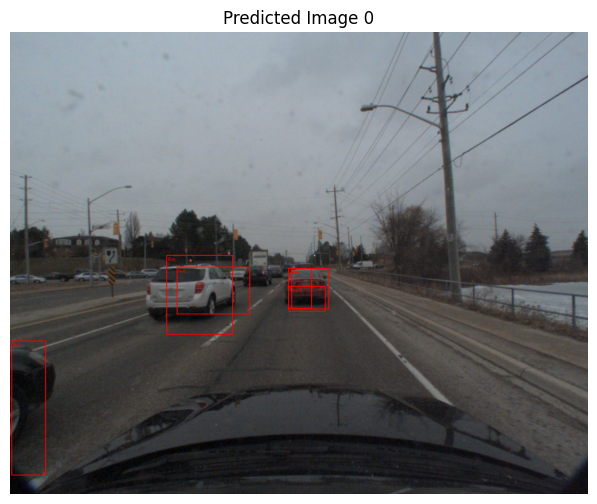

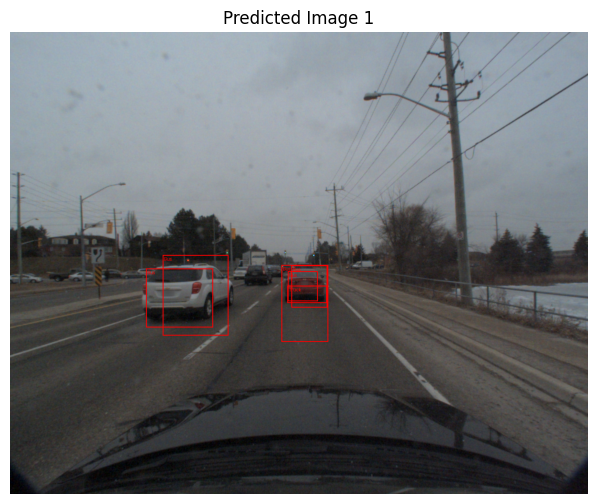

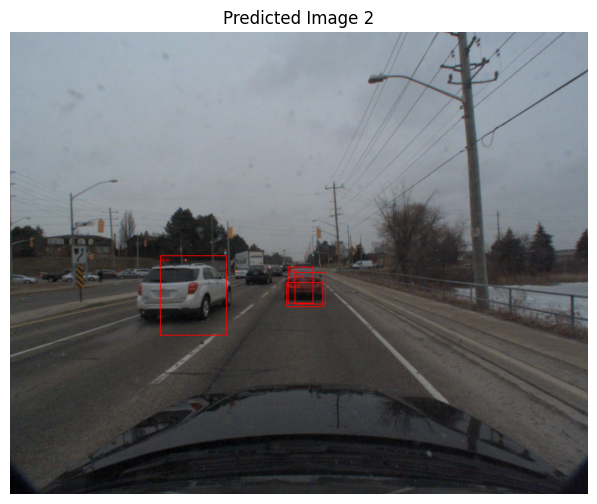

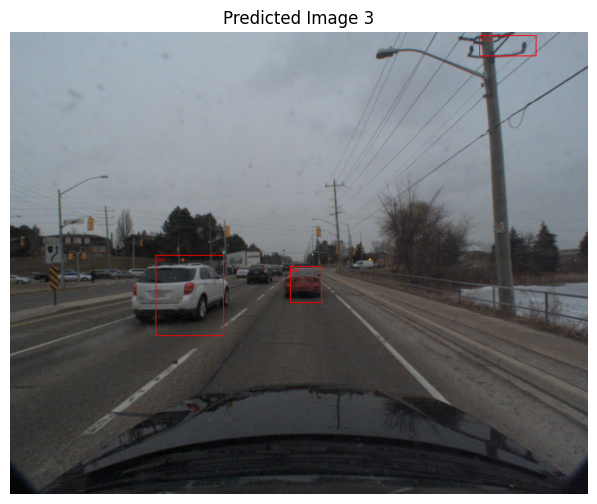

In [288]:
from torchvision.utils import draw_bounding_boxes

model.eval()

# Get a batch of validation data
imgs, targets = next(iter(val_loader))
imgs = [img.to(device) for img in imgs]

# Get predictions
with torch.no_grad():
    outputs = model(imgs)

# Define label map (adjust to your categories)
category_id_to_name = {
    1: "Car",
    2: "Pedestrian",
    3: "Truck",
    4: "Bus",
    5: "Traffic_Guidance_Objects"
}

# Loop through images and predictions
for i, (img, output) in enumerate(zip(imgs, outputs)):
    # Get boxes and labels
    boxes = output['boxes']
    labels = output['labels']
    scores = output['scores']

    # Filter out low-confidence predictions
    threshold = 0.4
    keep = scores >= threshold
    boxes = boxes[keep]
    labels = labels[keep]
    scores = scores[keep]

    # Convert image to uint8 (0–255) for drawing
    img_uint8 = (img.cpu() * 255).byte()

    # Convert labels to readable names if needed
    label_names = [category_id_to_name.get(l.item(), str(l.item())) for l in labels]
    annotated = draw_bounding_boxes(img_uint8, boxes.cpu(), labels=label_names, colors="red", width=2)

    # Convert to PIL and plot
    plt.figure(figsize=(10, 6))
    plt.imshow(F.to_pil_image(annotated))
    plt.title(f"Predicted Image {i}")
    plt.axis("off")
    plt.show()

In [311]:
import torchvision.transforms as T
transform = T.Compose([
    T.ToTensor()
])

# Update with your paths
image_root = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/0001/labeled"
annotation_path = "/kaggle/working/cadc_detectron2_annotations_all_cams.json"

dataset = CocoDetection(root=image_root, annFile=annotation_path, transform=transform)

def collate_fn(batch):
    return tuple(zip(*batch))



loading annotations into memory...
Done (t=0.67s)
creating index...
index created!


In [331]:
from torchvision.models.detection.ssd import SSDClassificationHead

# Extract in_channels list from current classification head conv layers
in_channels_list = [conv.in_channels for conv in model.head.classification_head.module_list]

# Get num_anchors list for each feature map location (list of ints)
num_anchors_list = model.anchor_generator.num_anchors_per_location()

# Number of classes including background
num_classes = 5

# Replace classification head with new one
model.head.classification_head = SSDClassificationHead(in_channels_list, num_anchors_list, num_classes)
model.to(device)


SSD(
  (backbone): SSDFeatureExtractorVGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=

In [329]:
# Inspect model.head.classification_head to find in_channels
print(model.head.classification_head)


SSDClassificationHead(
  (module_list): ModuleList(
    (0): Conv2d(512, 364, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): Conv2d(1024, 546, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (2): Conv2d(512, 546, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): Conv2d(256, 546, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4-5): 2 x Conv2d(256, 364, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
)


In [332]:
from torchvision.datasets import CocoDetection
from torchvision import transforms

dataset_root = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/0001/labeled"
annotation_file = "/kaggle/working/cadc_detectron2_annotations_all_cams.json"

# When you create the dataset, root points to dataset root, annFile points to the combined JSON
dataset = CocoDetection(root=dataset_root, annFile=annotation_file, transform=transforms.ToTensor())


loading annotations into memory...
Done (t=0.20s)
creating index...
index created!


In [ ]:
def collate_fn(batch):
    return tuple(zip(*batch))
data_loader = DataLoader(dataset, batch_size=4, shuffle=False, collate_fn=collate_fn)

In [336]:
def convert_coco_target(ann):
    boxes = []
    labels = []
    for obj in ann:
        boxes.append(obj["bbox"])
        labels.append(obj["category_id"])
    boxes = torch.tensor(boxes, dtype=torch.float32)
    boxes[:, 2:] += boxes[:, :2]  # xywh → xyxy
    labels = torch.tensor(labels, dtype=torch.int64)
    return {"boxes": boxes, "labels": labels}

losses_over_time = []
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

model.train()
for epoch in range(5):
    running_loss = 0.0
    for imgs, anns in data_loader:
        imgs = [img.to(device) for img in imgs]
        targets = [convert_coco_target(a) for a in anns]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(imgs, targets)
        loss = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
    
    avg_loss = running_loss / len(data_loader)
    losses_over_time.append(avg_loss)
    print(f"Epoch {epoch+1} Loss: {avg_loss:.4f}")


Epoch 1 Loss: 7.5360
Epoch 2 Loss: 5.6023
Epoch 3 Loss: 4.9259
Epoch 4 Loss: 4.3672
Epoch 5 Loss: 3.9409


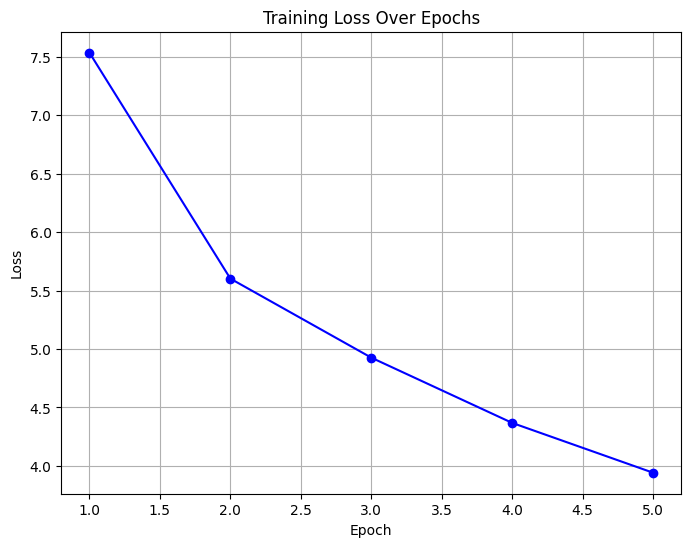

In [337]:
import matplotlib.pyplot as plt

# losses_over_time is your list of average losses per epoch

plt.figure(figsize=(8, 6))
plt.plot(range(1, len(losses_over_time) + 1), losses_over_time, marker='o', color='blue')
plt.title('Training Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.show()


In [338]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

# Assuming you have a validation dataset and dataloader (val_dataset, val_loader)
valdatasetpath = "/kaggle/input/cadc-dataset/dataset_subset/cadcd/2018_03_06/0002/labeled"
annotation_file = "/kaggle/working/cadc_validation_annotations_all_cams.json"
val_dataset = CocoDetection(root=valdatasetpath, annFile=annotation_file, transform=transforms.ToTensor())
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=collate_fn)

model.eval()

all_preds = []
all_gts = []

with torch.no_grad():
    for imgs, anns in val_loader:
        imgs = [img.to(device) for img in imgs]

        outputs = model(imgs)  # list of dicts per image

        # Collect predictions and ground truths in COCO format for evaluation
        for i, output in enumerate(outputs):
            boxes = output['boxes'].cpu().numpy()
            scores = output['scores'].cpu().numpy()
            labels = output['labels'].cpu().numpy()
        
            # Convert to COCO bbox format [x, y, w, h]
            boxes[:, 2:] -= boxes[:, :2]
        
            # ✅ Correct image ID from ground truth
            image_id = anns[i][0]['image_id']
        
            for box, score, label in zip(boxes, scores, labels):
                all_preds.append({
                    "image_id": image_id,
                    "category_id": int(label),
                    "bbox": box.tolist(),
                    "score": float(score),
                })


            # Also prepare ground truth in COCO format for this image
            gt_boxes = []
            gt_labels = []
            for obj in anns[i]:
                gt_boxes.append(obj['bbox'])
                gt_labels.append(obj['category_id'])

            all_gts.append({
                "image_id": image_id,
                "annotations": [
                    {"bbox": box, "category_id": label} for box, label in zip(gt_boxes, gt_labels)
                ]
            })

# At this point, all_preds has predictions, and all_gts has ground truth per image
# To run COCO evaluation, you need your ground truth in COCO JSON format and predicted results in COCO format.

# You can write `all_preds` to a JSON file and use pycocotools COCOeval as shown earlier:


loading annotations into memory...
Done (t=0.05s)
creating index...
index created!


IndexError: list index out of range

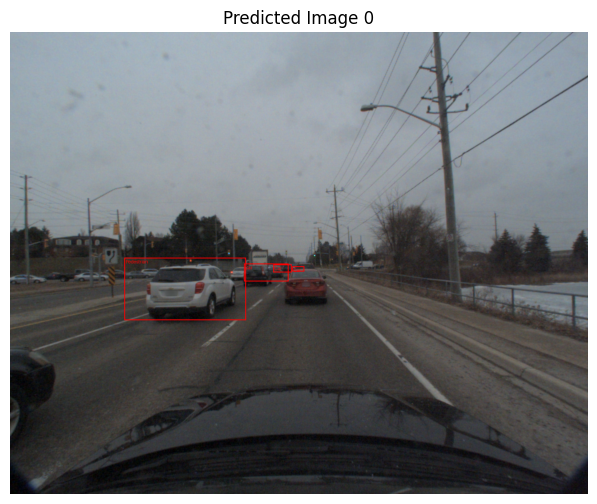

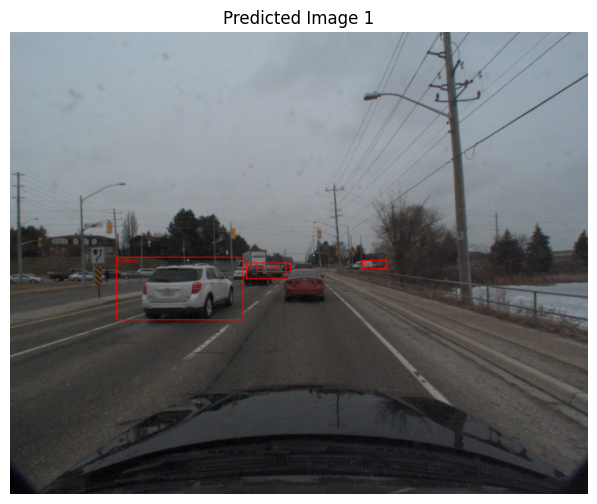

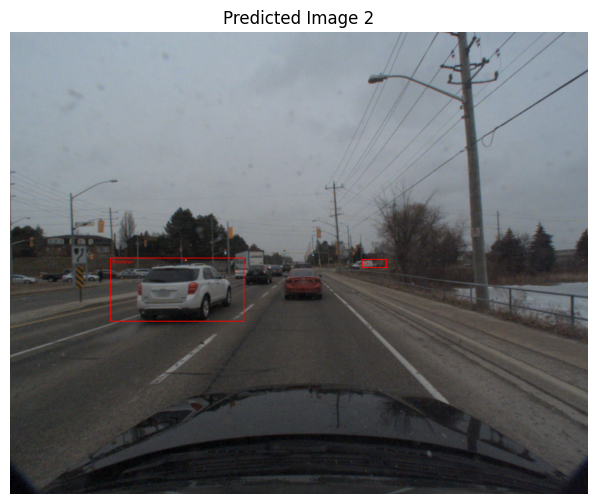

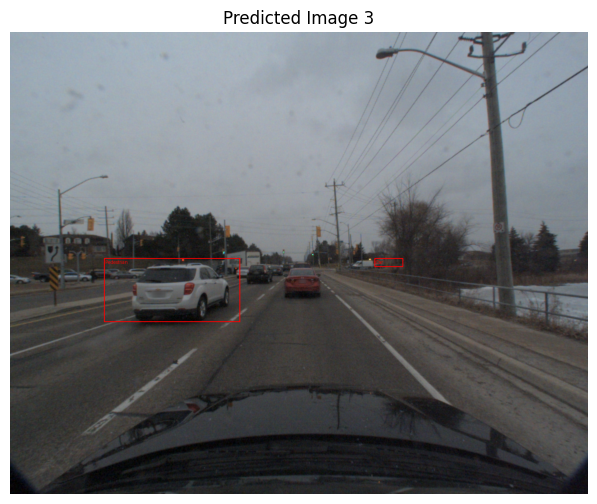

In [341]:
from torchvision.utils import draw_bounding_boxes

model.eval()

# Get a batch of validation data
imgs, targets = next(iter(val_loader))
imgs = [img.to(device) for img in imgs]

# Get predictions
with torch.no_grad():
    outputs = model(imgs)

# Define label map (adjust to your categories)
category_id_to_name = {
    1: "Car",
    2: "Pedestrian",
    3: "Truck",
    4: "Bus",
    5: "Traffic_Guidance_Objects"
}

# Loop through images and predictions
for i, (img, output) in enumerate(zip(imgs, outputs)):
    # Get boxes and labels
    boxes = output['boxes']
    labels = output['labels']
    scores = output['scores']

    # Filter out low-confidence predictions
    threshold = 0.6
    keep = scores >= threshold
    boxes = boxes[keep]
    labels = labels[keep]
    scores = scores[keep]

    # Convert image to uint8 (0–255) for drawing
    img_uint8 = (img.cpu() * 255).byte()

    # Convert labels to readable names if needed
    label_names = [category_id_to_name.get(l.item(), str(l.item())) for l in labels]
    annotated = draw_bounding_boxes(img_uint8, boxes.cpu(), labels=label_names, colors="red", width=2)

    # Convert to PIL and plot
    plt.figure(figsize=(10, 6))
    plt.imshow(F.to_pil_image(annotated))
    plt.title(f"Predicted Image {i}")
    plt.axis("off")
    plt.show()

In [346]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

# Load ground truth COCO dataset
annotation_path = "/kaggle/working/val_annotations.json"
coco_gt = COCO(annotation_path)
coco_dt = coco_gt.loadRes(all_preds)

if 'info' not in coco_gt.dataset:
    coco_gt.dataset['info'] = {
        "description": "Custom dataset",
        "url": "",
        "version": "1.0",
        "year": 2025,
        "contributor": "",
        "date_created": ""
    }



# Convert predictions to COCO format list of dicts
def prepare_for_coco_detection(outputs):
    coco_results = []
    for image_id, output in enumerate(outputs):
        boxes = output['boxes'].numpy()
        scores = output['scores'].numpy()
        labels = output['labels'].numpy()
        for box, score, label in zip(boxes, scores, labels):
            xmin, ymin, xmax, ymax = box
            width = xmax - xmin
            height = ymax - ymin
            coco_results.append({
                "image_id": image_id,  # map this correctly to your dataset's image IDs!
                "category_id": int(label),
                "bbox": [xmin, ymin, width, height],
                "score": float(score)
            })
    return coco_results

# coco_dt = coco_gt.loadRes(prepare_for_coco_detection(all_preds))

coco_eval = COCOeval(coco_gt, coco_dt, iouType='bbox')
coco_eval.evaluate()
coco_eval.accumulate()
coco_eval.summarize()


loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.05s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=10.31s).
Accumulating evaluation results...
DONE (t=0.29s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.002
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.001
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDet

In [344]:
print(type(all_preds))
print(type(all_preds[0]))
print(all_preds[0].keys() if isinstance(all_preds[0], dict) else all_preds[0])


<class 'list'>
<class 'dict'>
dict_keys(['image_id', 'category_id', 'bbox', 'score'])
